# Notebook Imports

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# from sklearn.datasets import load_boston /////deprecated\
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
load_boston = fetch_openml(data_id=531, as_frame=True, parser='pandas')

import seaborn as sns

import statsmodels.api as sm

import pandas as pd
%matplotlib inline

# Gather Data

[Source](https://www.law.berkeley.edu/files/Hedonic.PDF)

In [3]:
boston_dataset = load_boston

print(boston_dataset.keys())

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])


In [4]:
print(boston_dataset.DESCR)

**Author**:   
**Source**: Unknown - Date unknown  
**Please cite**:   

The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic
prices and the demand for clean air', J. Environ. Economics & Management,
vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics
...', Wiley, 1980.   N.B. Various transformations are used in the table on
pages 244-261 of the latter.
Variables in order:
CRIM     per capita crime rate by town
ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
INDUS    proportion of non-retail business acres per town
CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
NOX      nitric oxides concentration (parts per 10 million)
RM       average number of rooms per dwelling
AGE      proportion of owner-occupied units built prior to 1940
DIS      weighted distances to five Boston employment centres
RAD      index of accessibility to radial highways
TAX      full-value property-tax rate per $10

In [5]:
dir(boston_dataset)

['DESCR',
 'categories',
 'data',
 'details',
 'feature_names',
 'frame',
 'target',
 'target_names',
 'url']

## Datapoints and features

In [6]:
type(boston_dataset.data)

pandas.core.frame.DataFrame

In [7]:
boston_dataset.data.shape

(506, 13)

In [8]:
boston_dataset.feature_names

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [9]:
#Actual prices in thousands of dollars $$$
boston_dataset.target

0      24.0
1      21.6
2      34.7
3      33.4
4      36.2
       ... 
501    22.4
502    20.6
503    23.9
504    22.0
505    11.9
Name: MEDV, Length: 506, dtype: float64

## Data exploration with Pandas dataframes

In [10]:
#Create a pandas dataframe
data = pd.DataFrame(data=boston_dataset.data, columns=boston_dataset.feature_names)
data = data.astype(float)

#Add column with the price (target)
data['PRICE'] = boston_dataset.target

In [11]:
data.head() #The top rows look like this:

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [12]:
data.tail() #The bottom rows look like this:

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0
505,0.04741,0.0,11.93,0.0,0.573,6.030,80.8,2.5050,1.0,273.0,21.0,396.90,7.88,11.9


In [13]:
data.count() #show us the number of rows (Number of instances)

CRIM       506
ZN         506
INDUS      506
CHAS       506
NOX        506
RM         506
AGE        506
DIS        506
RAD        506
TAX        506
PTRATIO    506
B          506
LSTAT      506
PRICE      506
dtype: int64

## Cleaning Data - Check for Missing Values

In [14]:
#use isnull() from pandas to find out if there are any missing values

pd.isnull(data).any() #There are no missing values

CRIM       False
ZN         False
INDUS      False
CHAS       False
NOX        False
RM         False
AGE        False
DIS        False
RAD        False
TAX        False
PTRATIO    False
B          False
LSTAT      False
PRICE      False
dtype: bool

In [15]:
data.info() #The info() method prints information about a DataFrame including the index dtype and column dtypes, non-null values and memory usage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  PRICE    506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


## Visualising Data - Histograms, Distributions and Bar Charts
Shows the frequency of a certain value

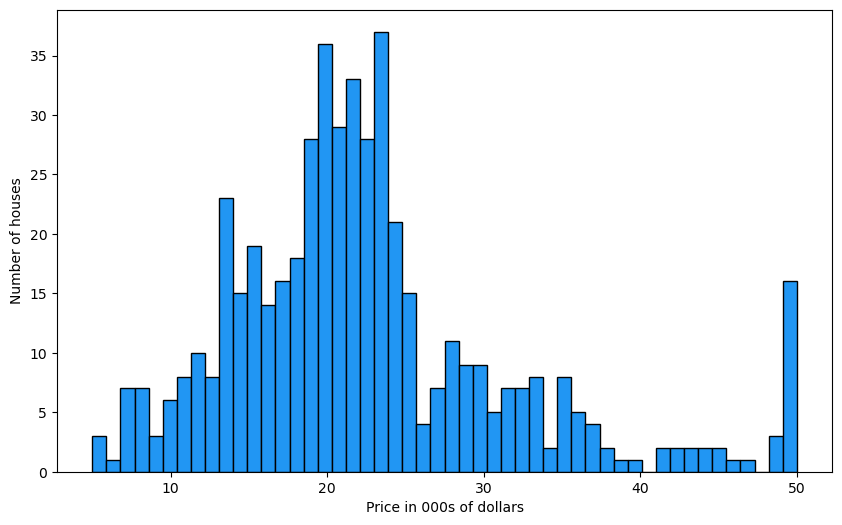

In [16]:
plt.figure(figsize=(10, 6))
plt.hist(data['PRICE'], bins=50, ec='black', color='#2196f3')
plt.xlabel('Price in 000s of dollars')
plt.ylabel('Number of houses')
plt.show()

/var/folders/2w/4sl_sqh94nngc2hqybxz80_r0000gp/T/ipykernel_40502/1744252681.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['PRICE'], hist=True, kde=False, color='#2196f3', hist_kws={'edgecolor':'black'})


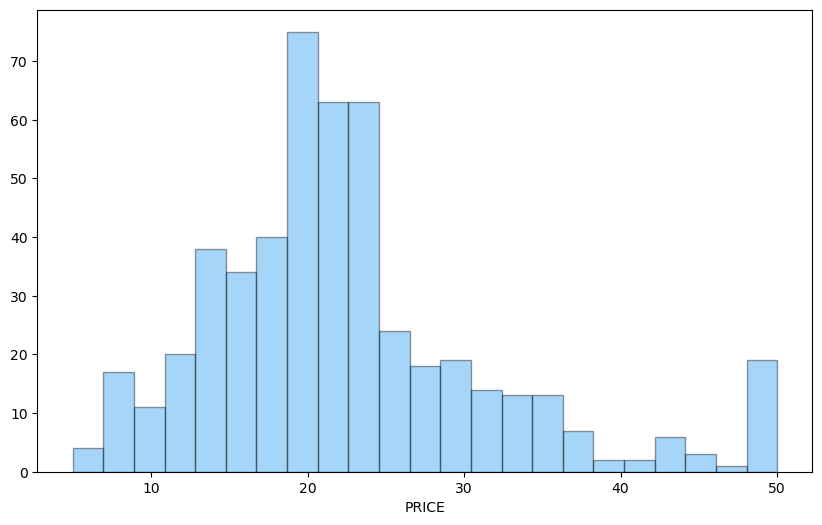

In [17]:
plt.figure(figsize=(10, 6))
sns.distplot(data['PRICE'], hist=True, kde=False, color='#2196f3', hist_kws={'edgecolor':'black'})
plt.show()

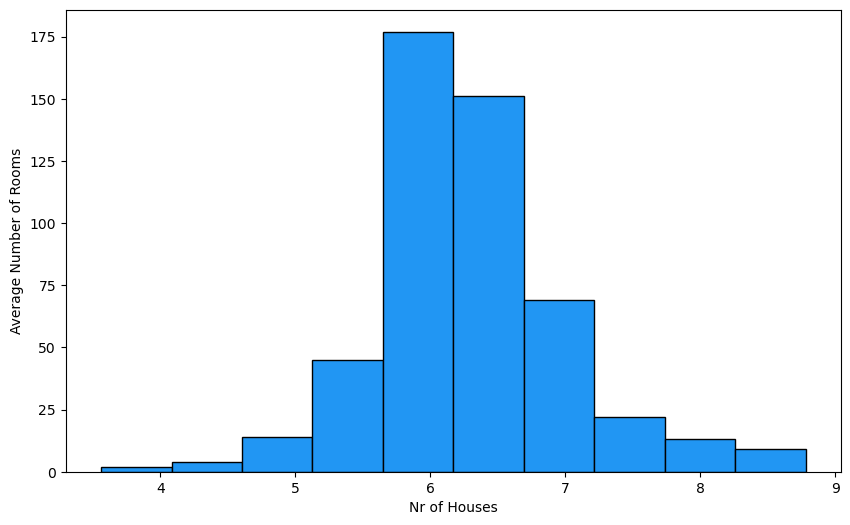

In [18]:
plt.figure(figsize=(10, 6))
plt.hist(data['RM'], bins=10, ec='black', color='#2196f3')
plt.xlabel('Nr of Houses')
plt.ylabel('Average Number of Rooms')
plt.show()

In [19]:
# How to find the average number of rooms in a house
data['RM'].mean()

6.284634387351779

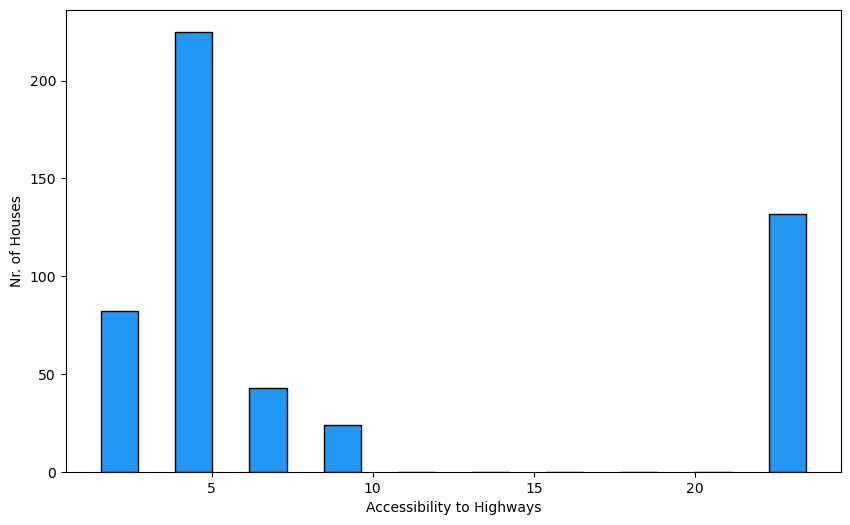

In [20]:
plt.figure(figsize=(10, 6))
plt.hist(data['RAD'], ec='black', color='#2196f3', rwidth= 0.5)
plt.xlabel('Accessibility to Highways')
plt.ylabel('Nr. of Houses')
plt.show()

In [21]:
data['RAD'].value_counts()

RAD
24.0    132
5.0     115
4.0     110
3.0      38
6.0      26
2.0      24
8.0      24
1.0      20
7.0      17
Name: count, dtype: int64

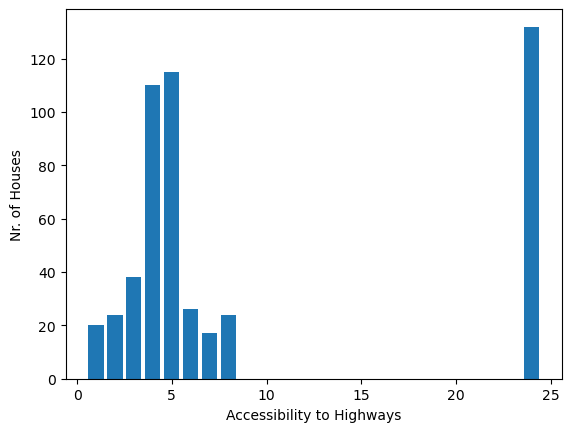

In [22]:
frequency = data['RAD'].value_counts()
# type(frequency)
# frequency.index
# frequency.axes[0]

plt.bar(frequency.index, height=frequency)#bar chart
plt.xlabel('Accessibility to Highways')
plt.ylabel('Nr. of Houses')
plt.show()

In [23]:
data[['PRICE','CHAS']].filter(items=['PRICE','CHAS']).groupby('CHAS').mean()


,PRICE
CHAS,
0.0,22.093843
1.0,28.440000


# Descriptive Statistics

In [24]:
data['PRICE'].min()

5.0

In [25]:
data['PRICE'].max()

50.0

In [26]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


## Correlation

## $$ \rho _{XY} = corr(X,Y) $$
## $$ -1.0 \leq \rho _{XY} \leq 1.0 $$

In [27]:
# Will retreive the price column and the series we want to calculate the correlation with (RM) 
data['PRICE'].corr(data['RM'])

0.6953599470715396

In [28]:
#Challenge: Calculate the correlation between property prices and the pupil-teacher ratio
data['PRICE'].corr(data['PTRATIO'])

-0.5077866855375618

In [29]:
data.corr()#Pearson Correlation Coefficients

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


In [30]:
mask = np.zeros_like(data.corr())
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True


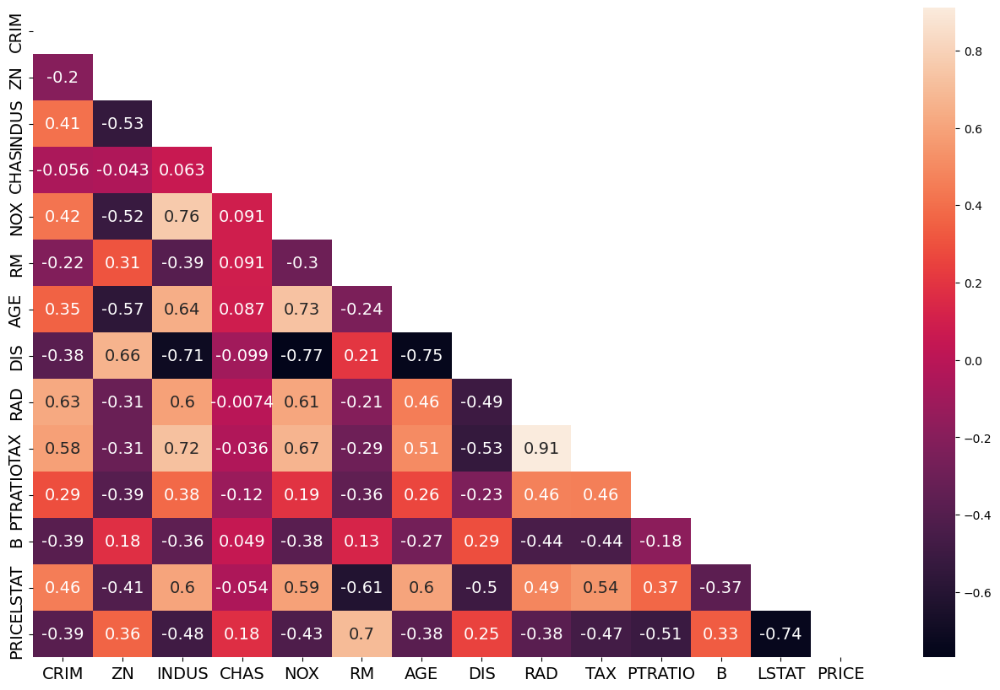

In [31]:
plt.figure(figsize=(16, 10))

sns.heatmap(data.corr(), mask=mask, annot=True, annot_kws={"size":14})
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

# Limitations:
## - Continous Data Only
## - Corelation Does not Imply Causation: 
Everyone who drank water in 1850 is dead today. This does not mean that water is 100% fatal to human beings.
## - Linear Relationships Only

In [32]:
print(boston_dataset.DESCR)

#TODO: Does the industry feature and distance feature make the model better or worse?


**Author**:   
**Source**: Unknown - Date unknown  
**Please cite**:   

The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic
prices and the demand for clean air', J. Environ. Economics & Management,
vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics
...', Wiley, 1980.   N.B. Various transformations are used in the table on
pages 244-261 of the latter.
Variables in order:
CRIM     per capita crime rate by town
ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
INDUS    proportion of non-retail business acres per town
CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
NOX      nitric oxides concentration (parts per 10 million)
RM       average number of rooms per dwelling
AGE      proportion of owner-occupied units built prior to 1940
DIS      weighted distances to five Boston employment centres
RAD      index of accessibility to radial highways
TAX      full-value property-tax rate per $10

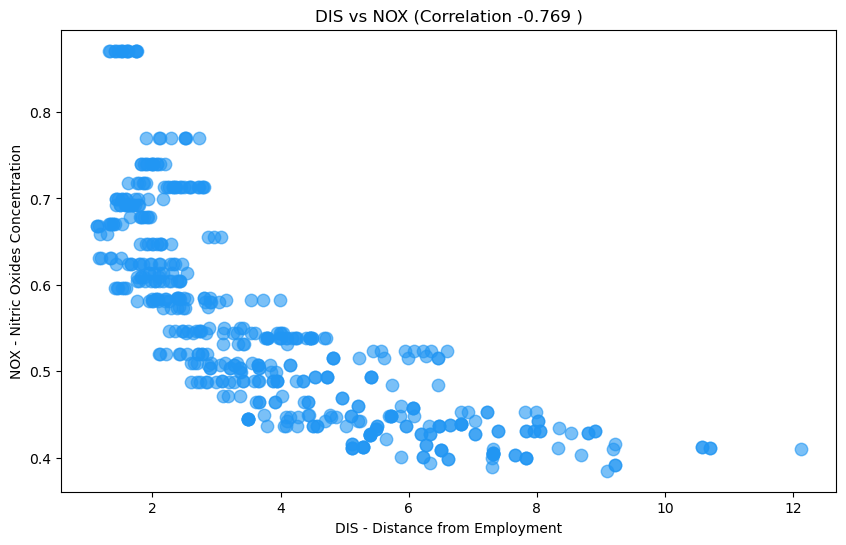

In [33]:
#Challange: Picture the relationship between pollution and distance 
#create a scatter plot with the DIS and NOX columns
nox_dis_corr = round(data['NOX'].corr(data['DIS']),3)


plt.figure(figsize=(10, 6))
plt.title(f'DIS vs NOX (Correlation {nox_dis_corr} )')
plt.xlabel('DIS - Distance from Employment')
plt.ylabel('NOX - Nitric Oxides Concentration')
plt.scatter(data['DIS'], data['NOX'], color='#2196f3', alpha=0.6, s=80)
plt.show()

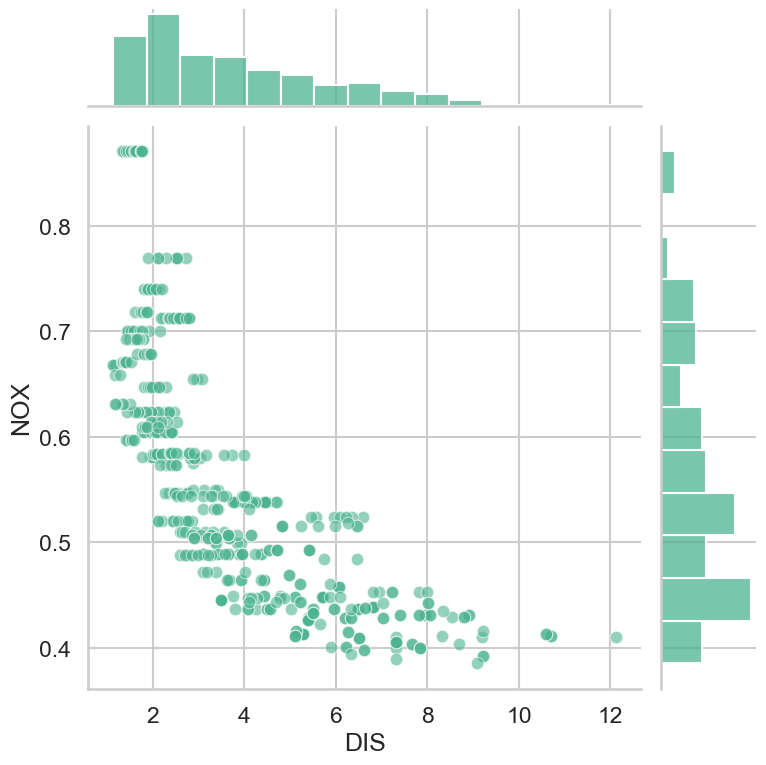

In [34]:
sns.set()
sns.set_style('whitegrid')
sns.set_context('talk')
sns.jointplot(x=data['DIS'], y=data['NOX'], color='#4cb391', height=8, alpha=0.6)
plt.show()

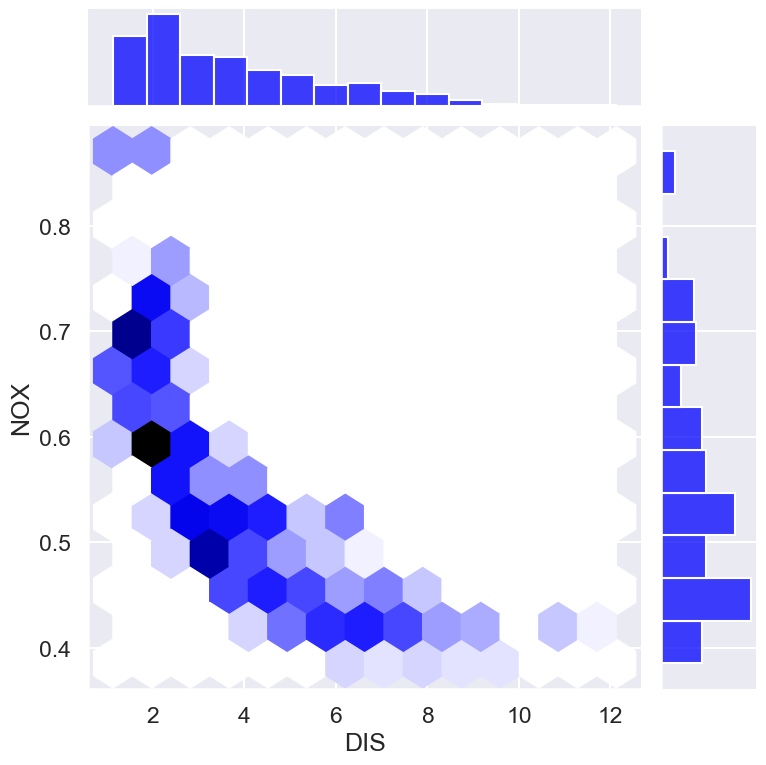

In [35]:
sns.set()
sns.set_context('talk')
sns.jointplot(x=data['DIS'], y=data['NOX'], color='blue',kind='hex', height=8)
plt.show()

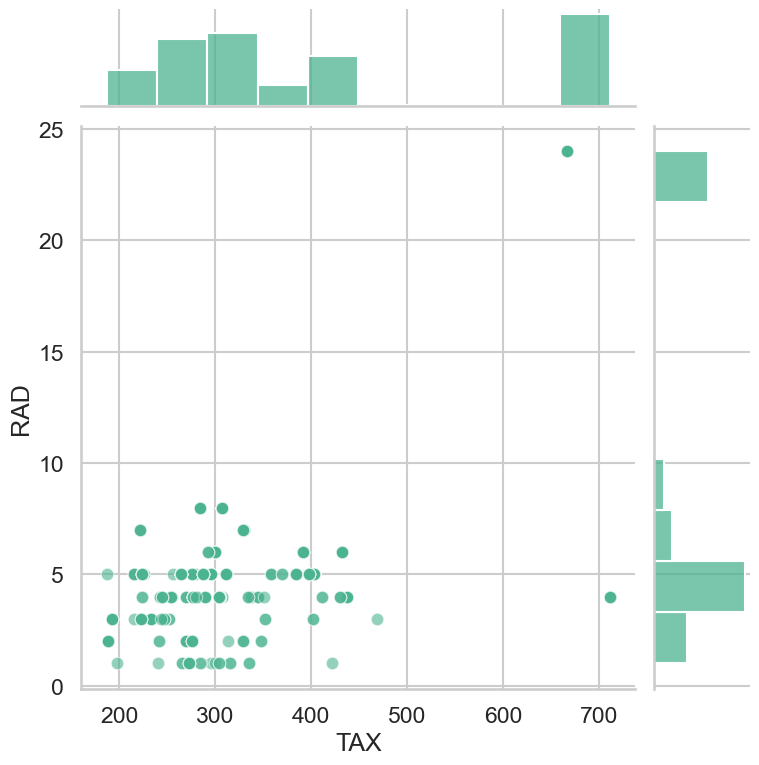

In [36]:
sns.set()
sns.set_style('whitegrid')
sns.set_context('talk')
sns.jointplot(x=data['TAX'], y=data['RAD'], color='#4cb391', height=8, alpha=0.6)
plt.show()

/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


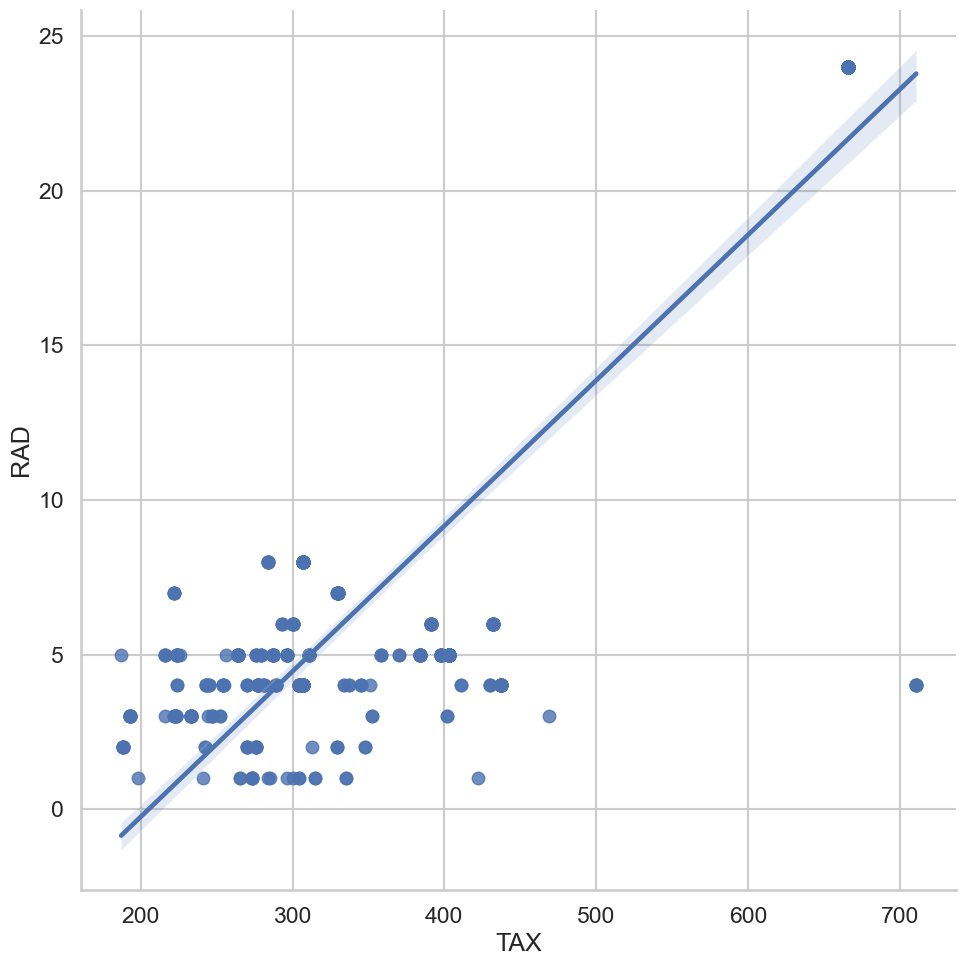

In [37]:
sns.lmplot(x='TAX', y='RAD', data=data, height=10)
plt.show()

/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


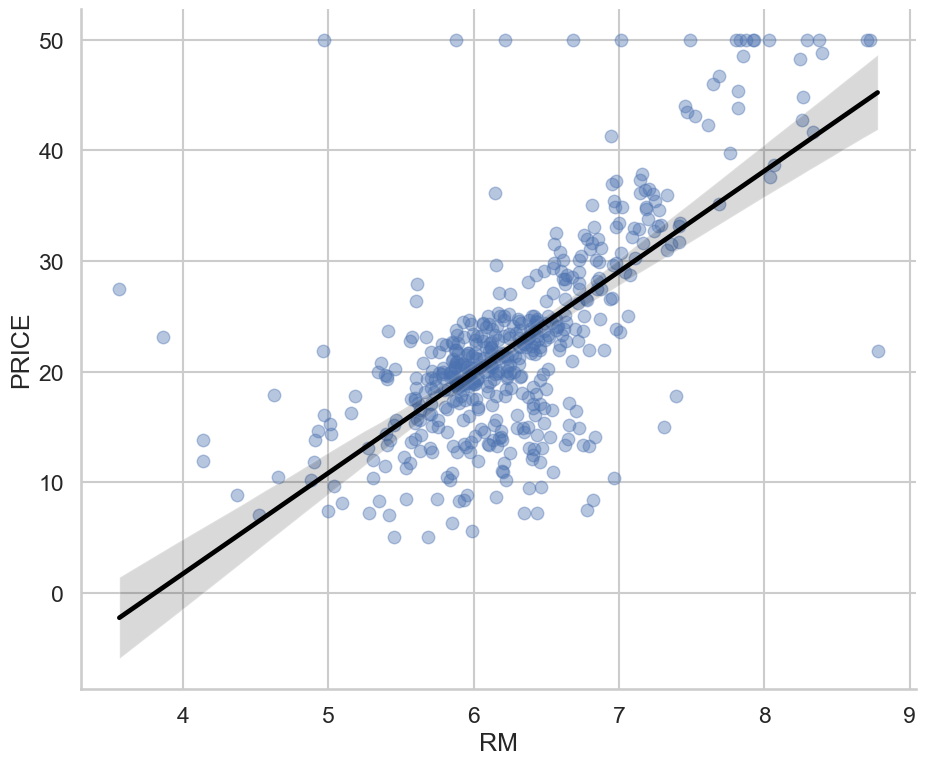

In [38]:
#Challange: Create a scatter plot between the house prices and the number of rooms (RM)
sns.lmplot(x='RM', y='PRICE', data=data, height=8, aspect = 1.2, line_kws={'color':'black'}, scatter_kws={'alpha':0.4})
plt.show()

/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


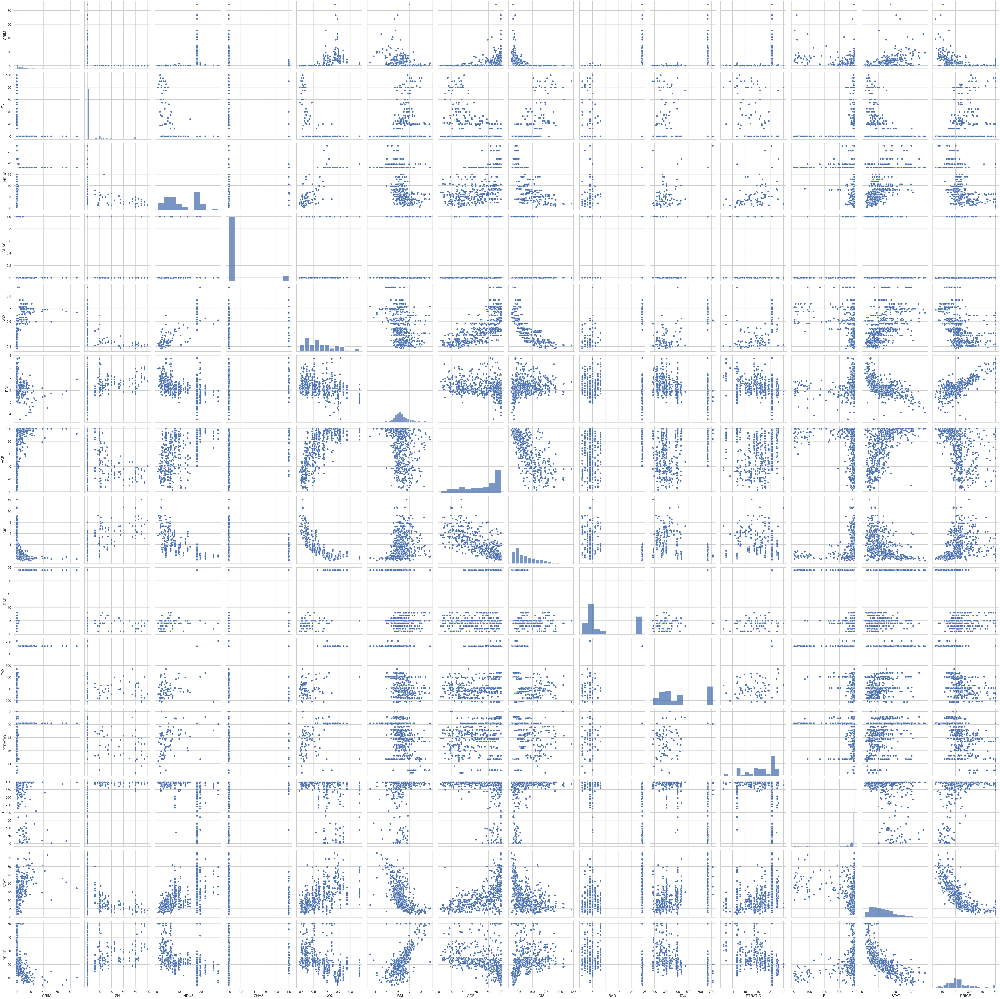

CPU times: user 16.2 s, sys: 185 ms, total: 16.3 s
Wall time: 15 s


In [39]:
%%time
sns.pairplot(data, height=5, aspect=1)
plt.show()

/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


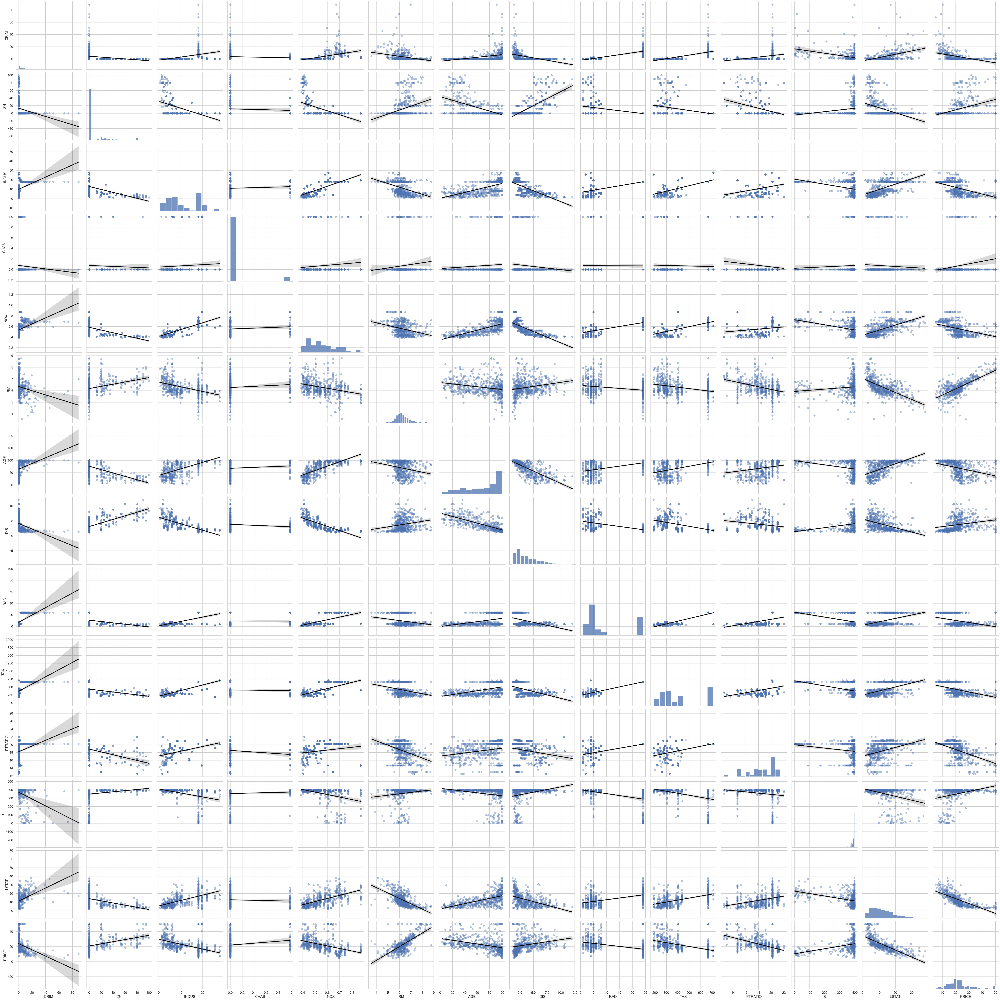

In [40]:
sns.pairplot(data, kind='reg', height=5, aspect=1, plot_kws={'line_kws':{'color':'black'}, 'scatter_kws': {'alpha': 0.4}})
plt.show()

## Training and Test Dataset Split

In [41]:
prices = data['PRICE']
features = data.drop('PRICE', axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    prices, 
                                                    test_size=0.2, 
                                                    random_state=10)

# % of training set 
len(X_train) / len(features)

0.7984189723320159

In [42]:
# % of test set
X_test.shape[0] / features.shape[0]

0.2015810276679842

## Multivariable Regression

In [43]:
regr = LinearRegression()
regr.fit(X_train, y_train)



#Challange: print out r-squared for training and test data sets
#r-square: residual sum of squares
print('Training data r-squared:', regr.score(X_train, y_train))
print('Test data r-squared:', regr.score(X_test, y_test))

print('Intercept', regr.intercept_)
pd.DataFrame(data=regr.coef_, index=X_train.columns, columns=['coef'])

Training data r-squared: 0.750121534530608
Test data r-squared: 0.6709339839115633
Intercept 36.533051382824496


,coef
CRIM,-0.128181
ZN,0.063198
INDUS,-0.007576
CHAS,1.974515
NOX,-16.271989
RM,3.108456
AGE,0.016292
DIS,-1.483014
RAD,0.303988
TAX,-0.012082


## Data Transformations

In [44]:
data['PRICE'].skew()


1.1080984082549072

In [48]:
y_log = np.log(data['PRICE'])
y_log.head()
y_log.skew()

-0.33032129530987864

/var/folders/2w/4sl_sqh94nngc2hqybxz80_r0000gp/T/ipykernel_40502/950227178.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_log)


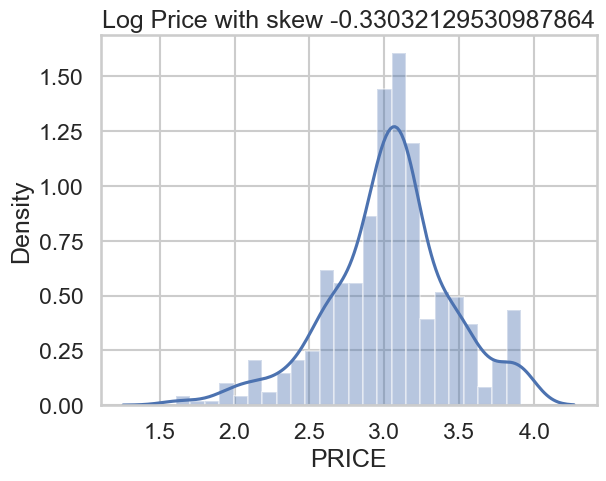

In [51]:
sns.distplot(y_log)
plt.title(f'Log Price with skew {y_log.skew()}')
plt.show()

/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


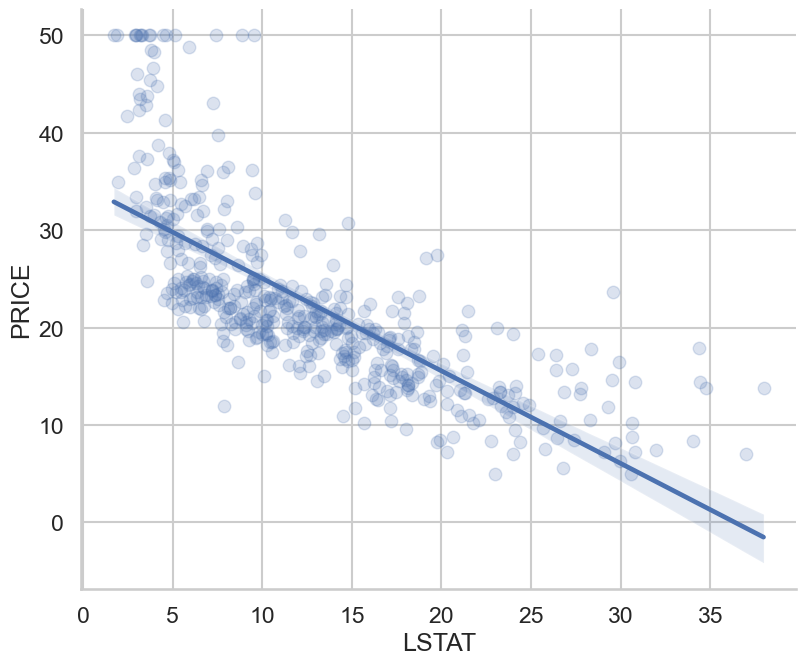

In [53]:
sns.lmplot(x='LSTAT', y='PRICE', data=data, height=7,
            aspect=1.2, scatter_kws={'alpha':0.2})
plt.show()


/Users/Albert/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


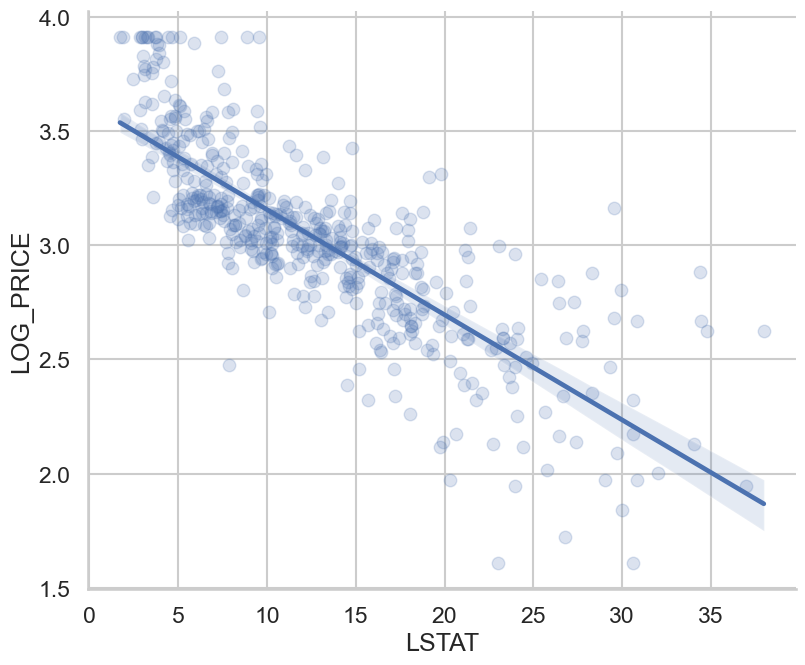

In [56]:
transformed_data = features
transformed_data['LOG_PRICE'] = y_log

sns.lmplot(x='LSTAT', y='LOG_PRICE', data=transformed_data, height=7,
            aspect=1.2, scatter_kws={'alpha':0.2})
plt.show()


## Regression using LOG prices

In [57]:
prices = np.log(data['PRICE'])
features = data.drop('PRICE', axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, prices, test_size = 0.2, random_state = 10)

regr = LinearRegression()
regr.fit(X_train, y_train)

print('Training data r-squared:', regr.score(X_train, y_train))
print('Test data r-squared:', regr.score(X_test,y_test))

print('Intercept', regr.intercept_)
pd.DataFrame(data=regr.coef_, index=X_train.columns, columns=['coef'])

Training data r-squared: 0.7930234826697584
Test data r-squared: 0.7446922306260724
Intercept 4.059943871775193


,coef
CRIM,-0.010672
ZN,0.001579
INDUS,0.002030
CHAS,0.080331
NOX,-0.704068
RM,0.073404
AGE,0.000763
DIS,-0.047633
RAD,0.014565
TAX,-0.000645


In [58]:
#Charles River Property Premium
np.e**0.080331

1.0836456950439142

A regression coefficient signifficance is called the p-value. The p-value is the probability that a given coefficient is actually zero.

if the p-value < 0.05 it means that the coefficient is statistically significant.

if the p-value > 0.05 it means that the coefficient is statistically insignificant.

## p values & Evaluating Coefficients

In [71]:
X_incl_const = sm.add_constant(X_train)


#Call OLS function - Ordinary Least Squares
model = sm.OLS(y_train, X_incl_const)

results = model.fit()

#results.params
#results.pvalues

pd.DataFrame({'coef': results.params, 'p-value': round(results.pvalues, 3)})

,coef,p-value
const,4.059944,0.000
CRIM,-0.010672,0.000
ZN,0.001579,0.009
INDUS,0.002030,0.445
CHAS,0.080331,0.038
NOX,-0.704068,0.000
RM,0.073404,0.000
AGE,0.000763,0.209
DIS,-0.047633,0.000
RAD,0.014565,0.000
